<p style="align: center;"><img align=center src="https://cdnb.artstation.com/p/assets/covers/images/060/407/559/large/vahid-ghobadi-arfai-vahid-ghobadi-arfai-lo.jpg?1678483232" width=300 height=320/></p>
<h3 style="text-align: center;"><b>Семинар №7 ФЭФМ МФТИ</b></h3>

# Задача С

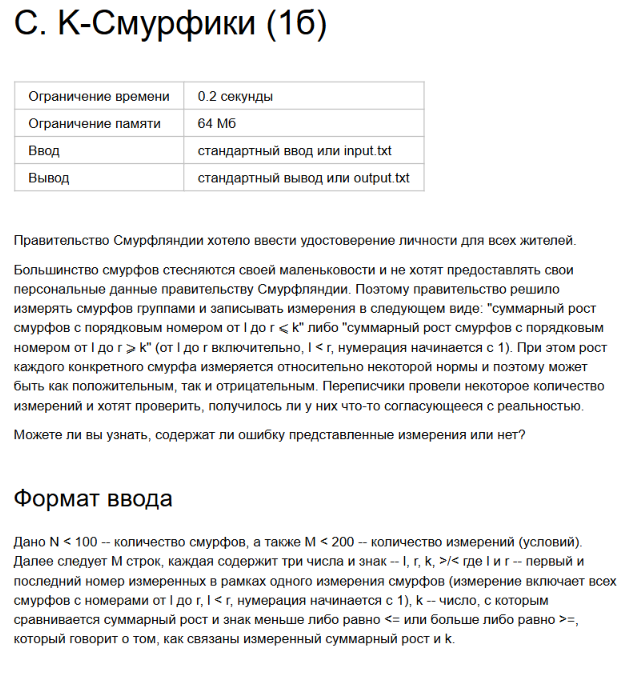

У нас есть N смурфов, и их рост можно представить как массив a[], где a[i] — рост смурфа с номером i.

У нас есть M условий, каждое из которых задает ограничение на сумму роста смурфов с номерами от l до r.


Каждое условие можно представить как линейное неравенство:

Если условие имеет вид l r k >=, то:
a[l] + a[l+1] + ... + a[r] >= k.

Если условие имеет вид l r k <=, то:
a[l] + a[l+1] + ... + a[r] <= k.

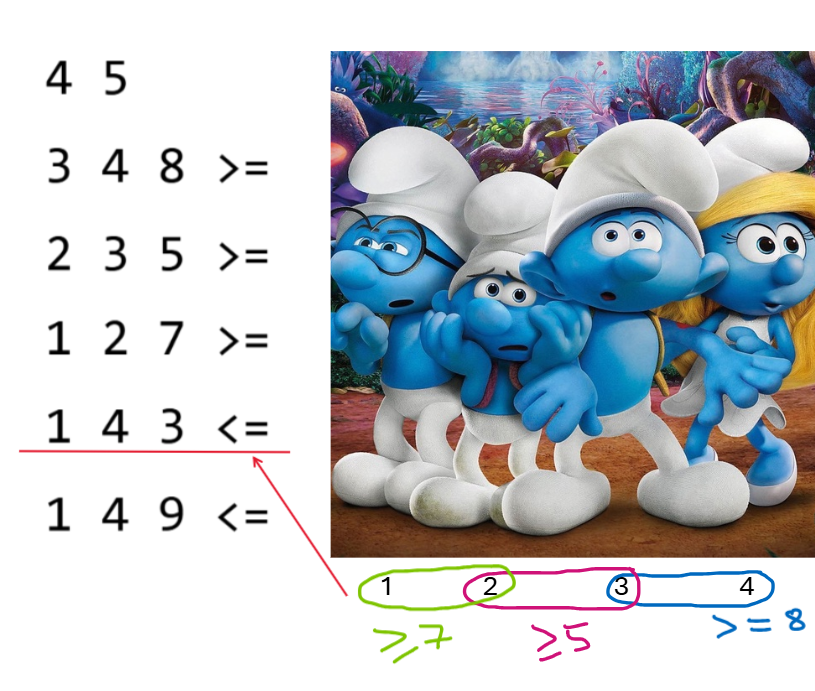

a[3] + a[4] >= 8

a[2] + a[3] >= 5

a[1] + a[2] >= 7

a[1] + a[2] + a[3] + a[4] <= 3

a[1] + a[2] + a[3] + a[4] <= 9

Из четвертого условия следует, что сумма всех четырех смурфов не превышает 3. Однако из первого и третьего условий следует, что a[3] + a[4] >= 8 и a[1] + a[2] >= 7. 

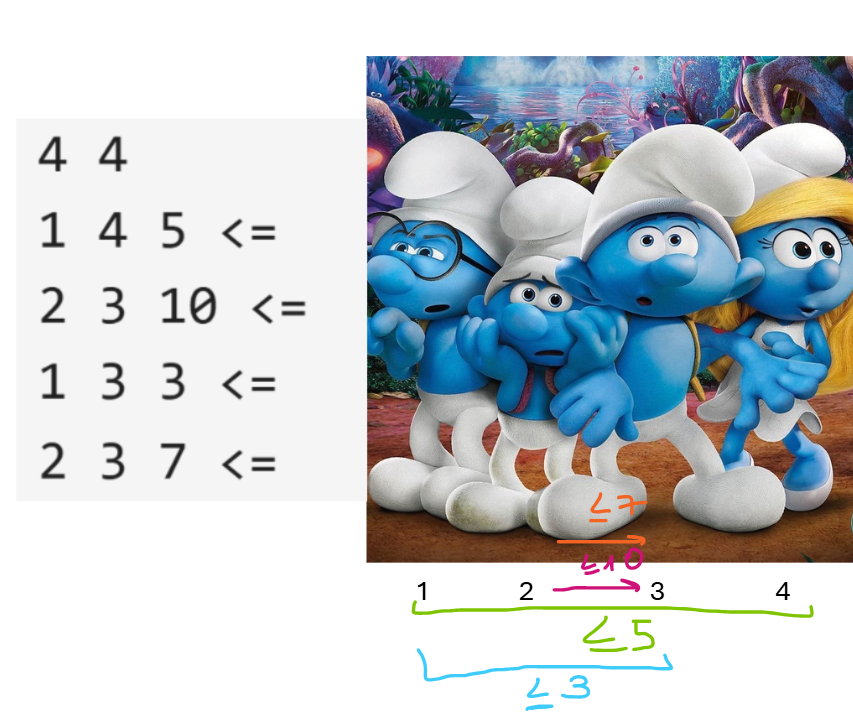

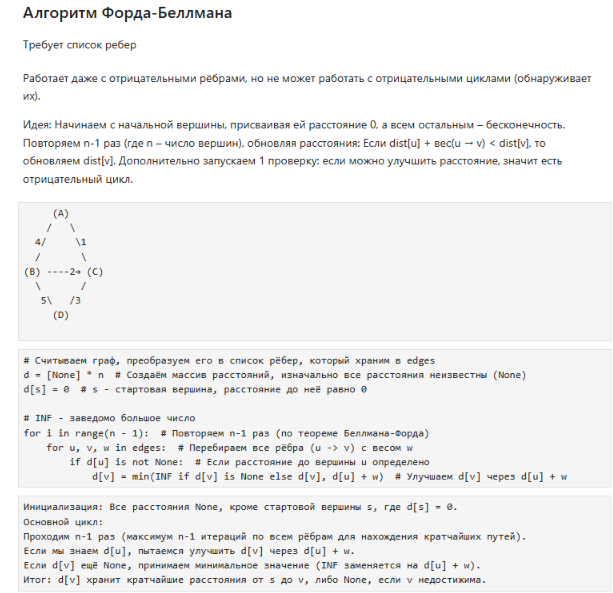

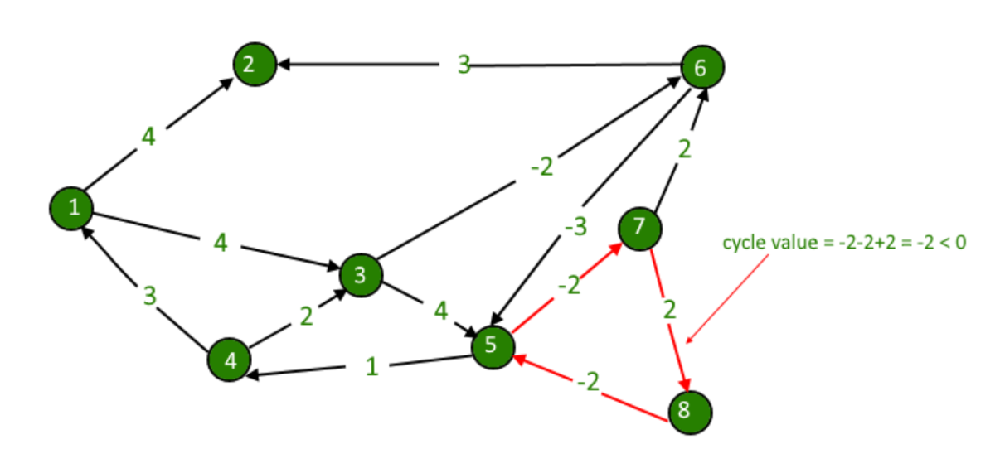

Алгоритм Беллмана-Форда используется для поиска кратчайших путей в графе, где ребра представляют собой ограничения на разности между переменными. Если у нас есть ребро из вершины 
u в вершину v с весом w, это означает:

s[v]≤s[u]+w

Тогда

(s[0]−s[2])+(s[2]−s[4])+(s[4]−s[0])≤−7+(−8)+3=−12

Это означает, что система содержит отрицательный цикл.

# Потоки и сети в графах

V — множество вершин (узлов),
E — множество рёбер (дуг), которые соединяют вершины.

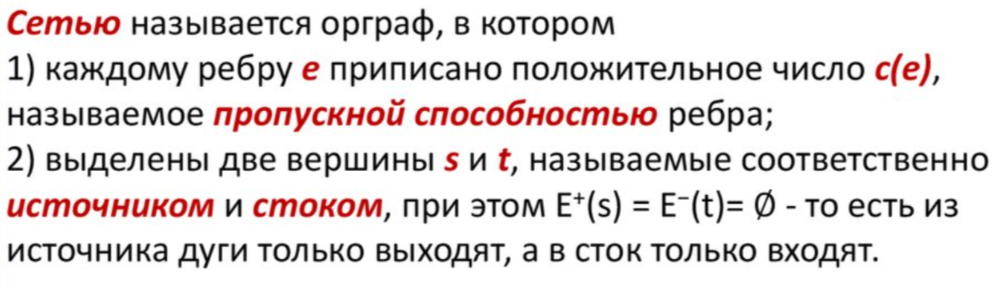

Каждое ребро имеет пропускную способность c(u,v)≥0, которая определяет максимальное количество ресурса, которое может проходить через это ребро. 

Например, если пропускная способность ребра B0 - B1 равна 3, а ребра В1 - В2 — 4, то это означает, что путём B0 - В1 можно пропустить 3 машины в единицу времени, а путём B1 - В2 — 4 машины. 

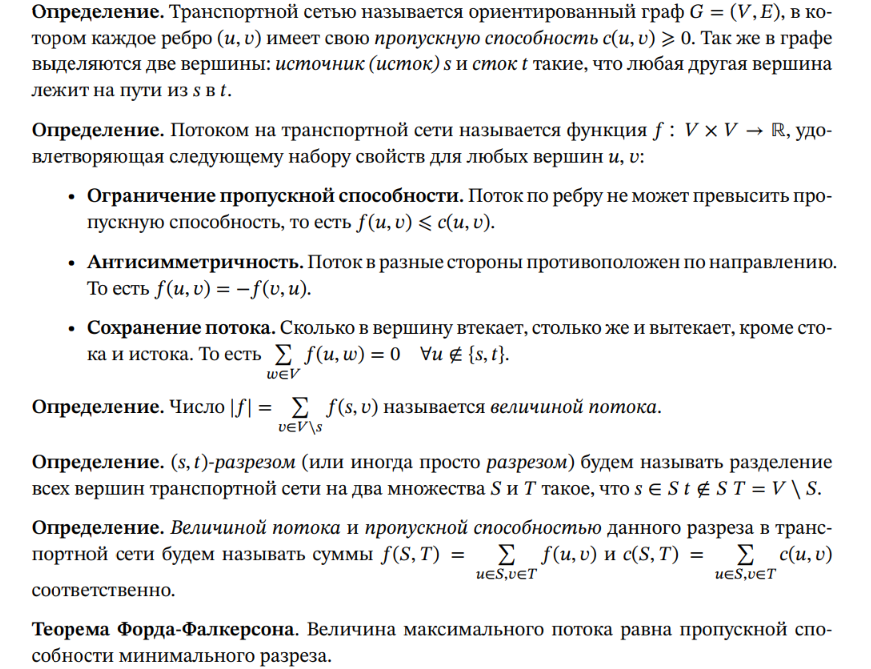

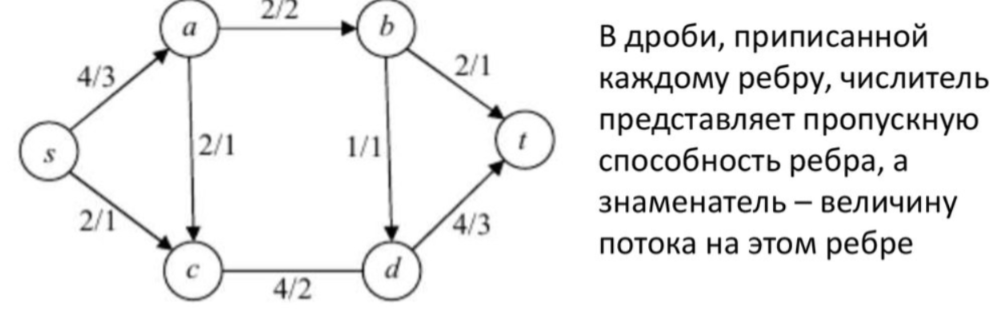

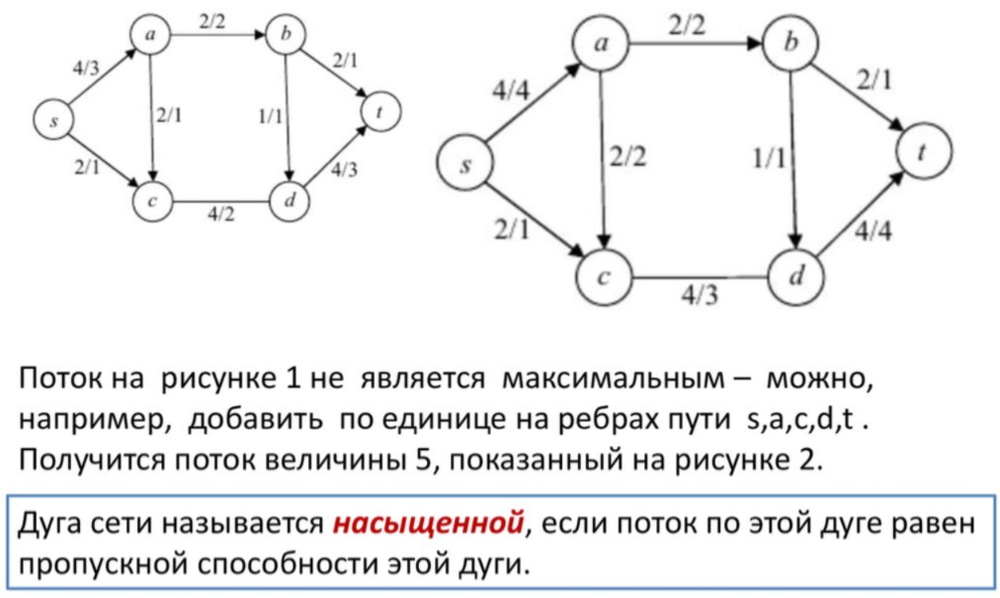

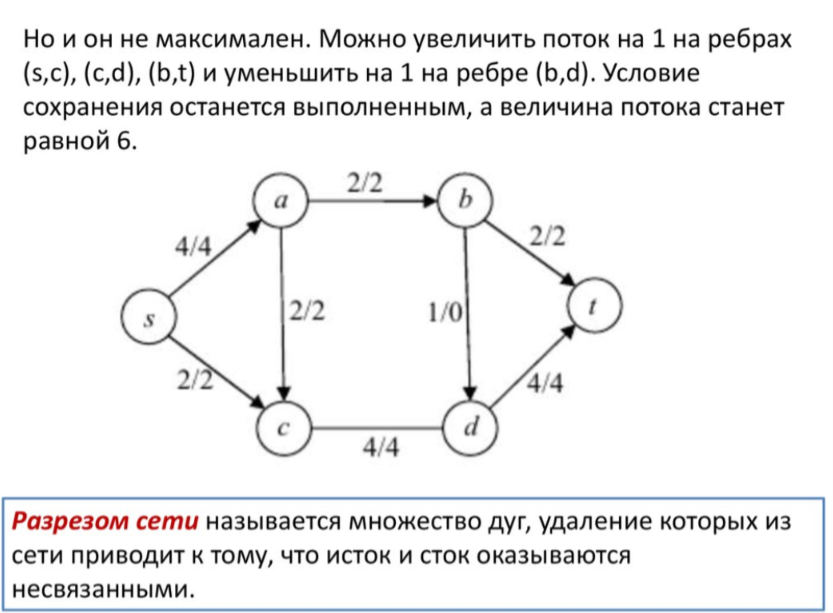

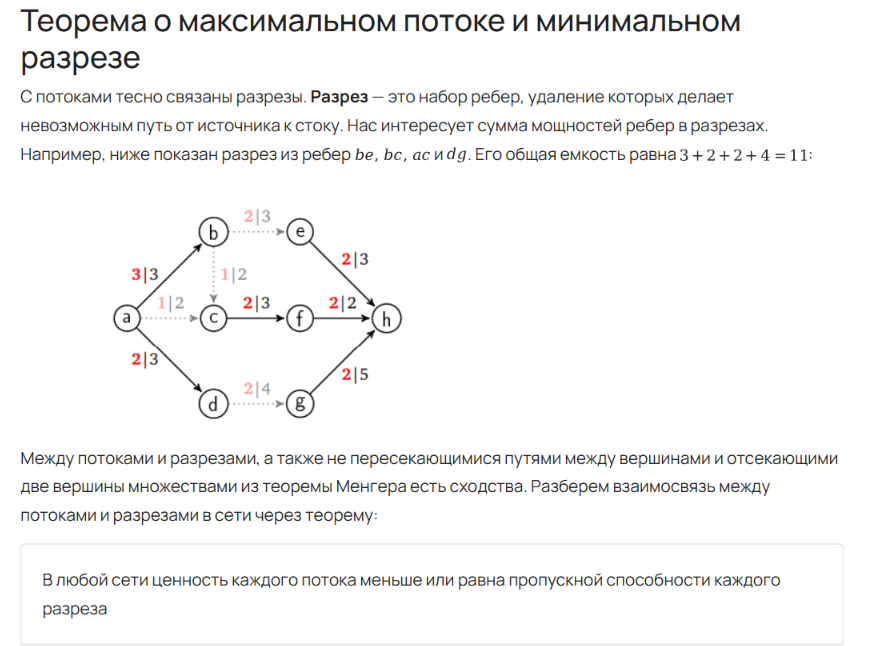

# Алгоритм Форда Фалкерсона

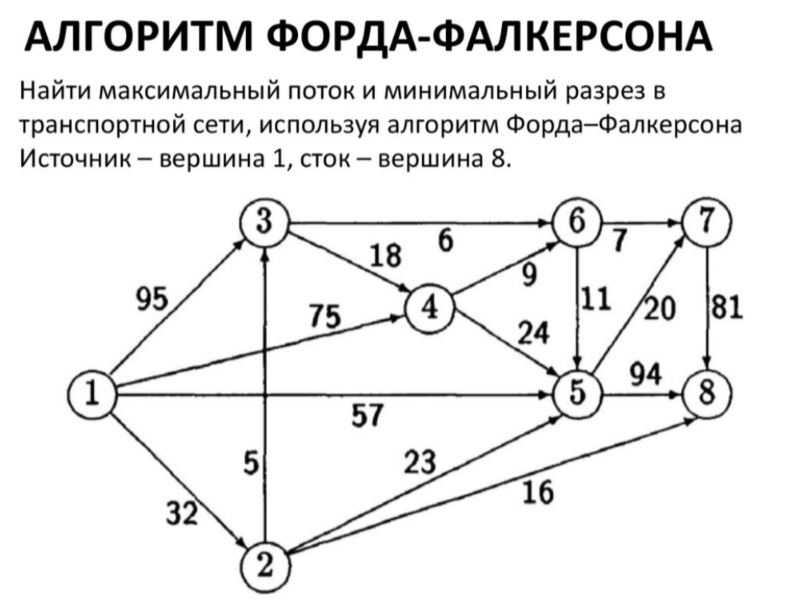

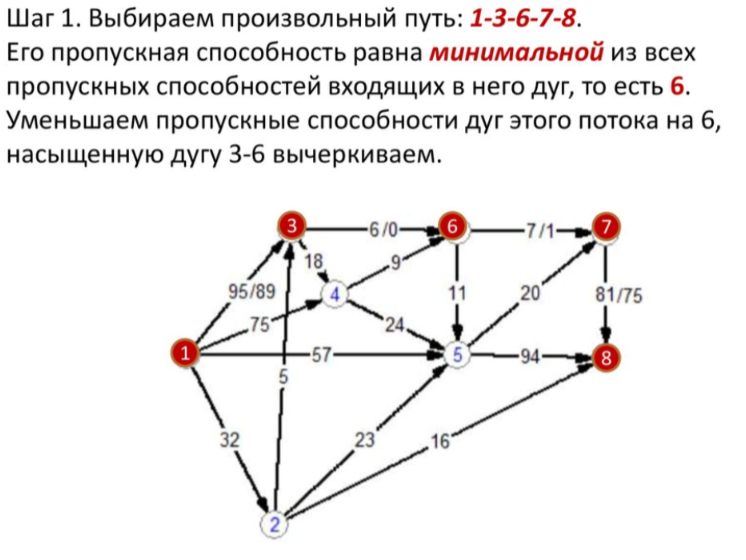

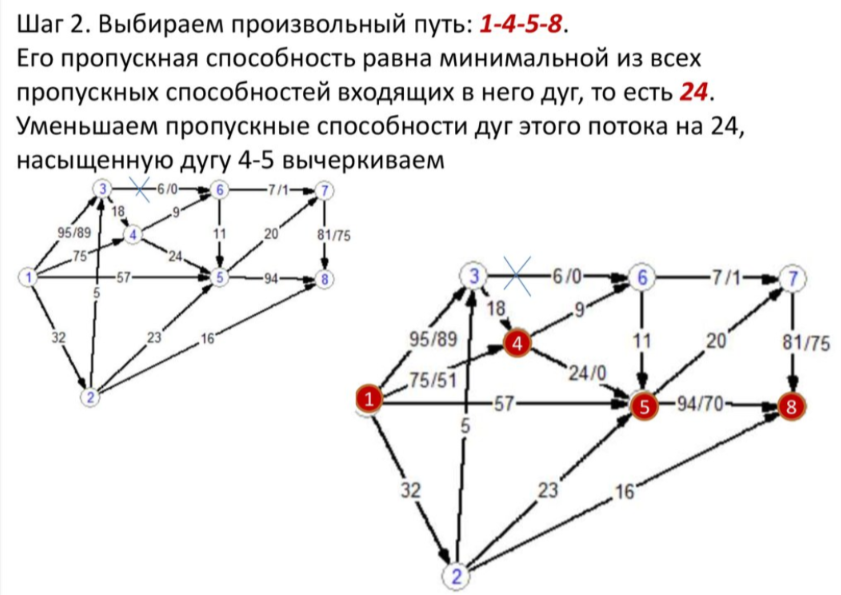

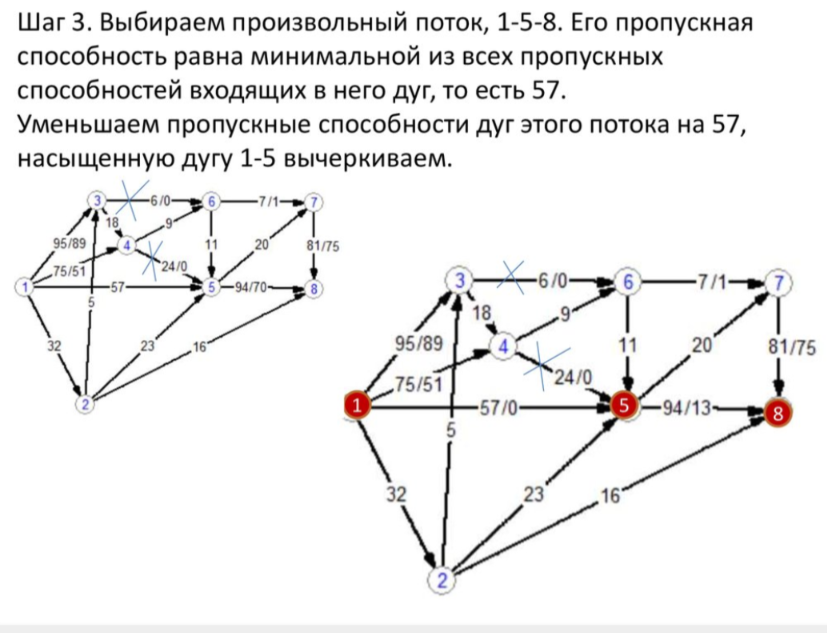

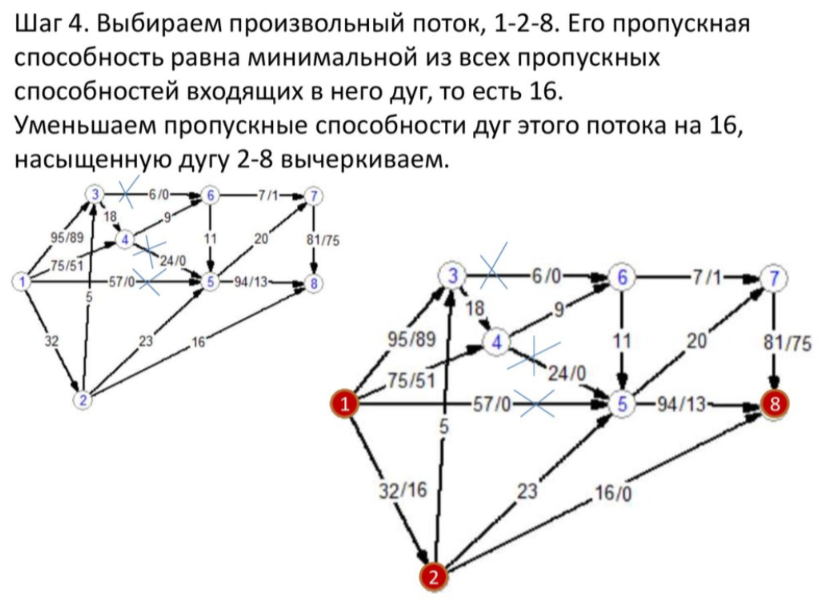

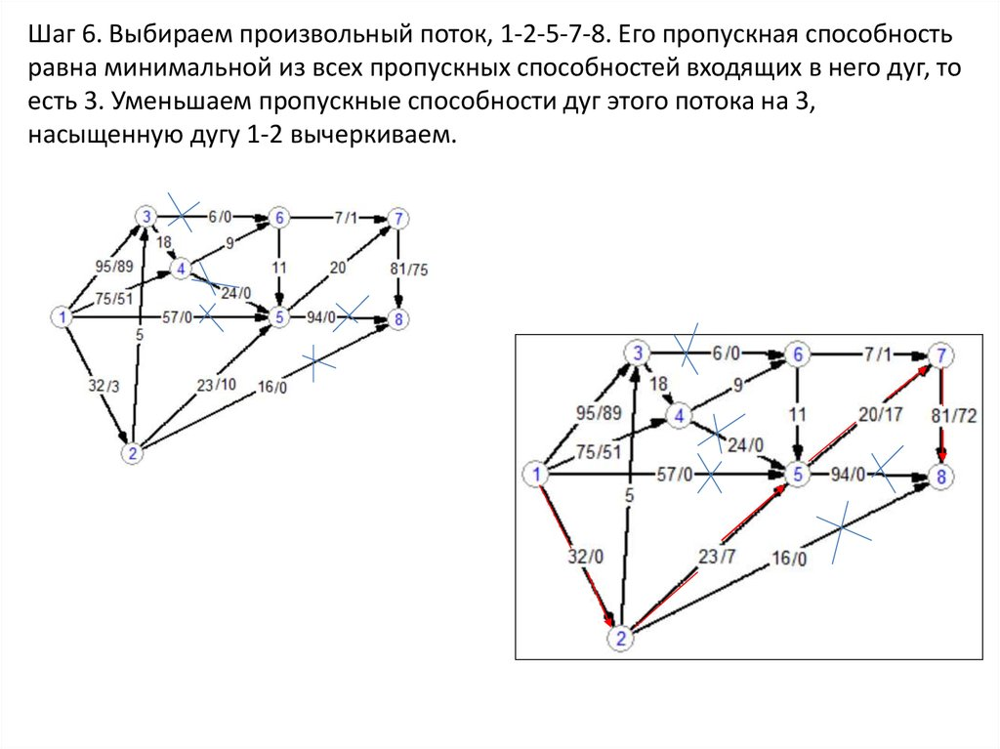

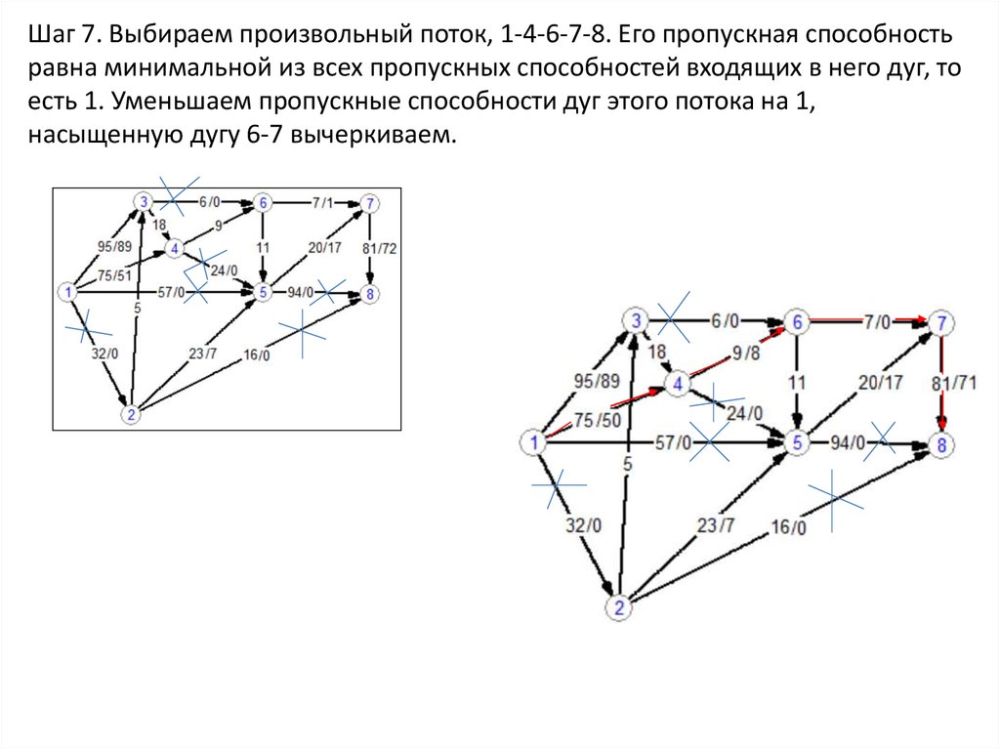

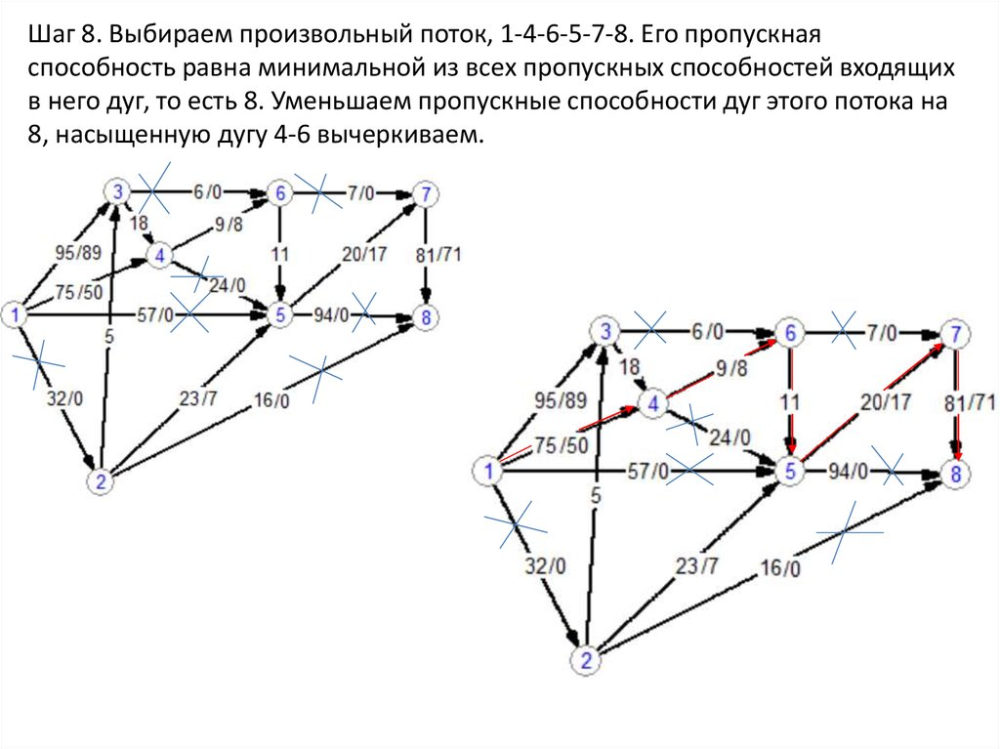

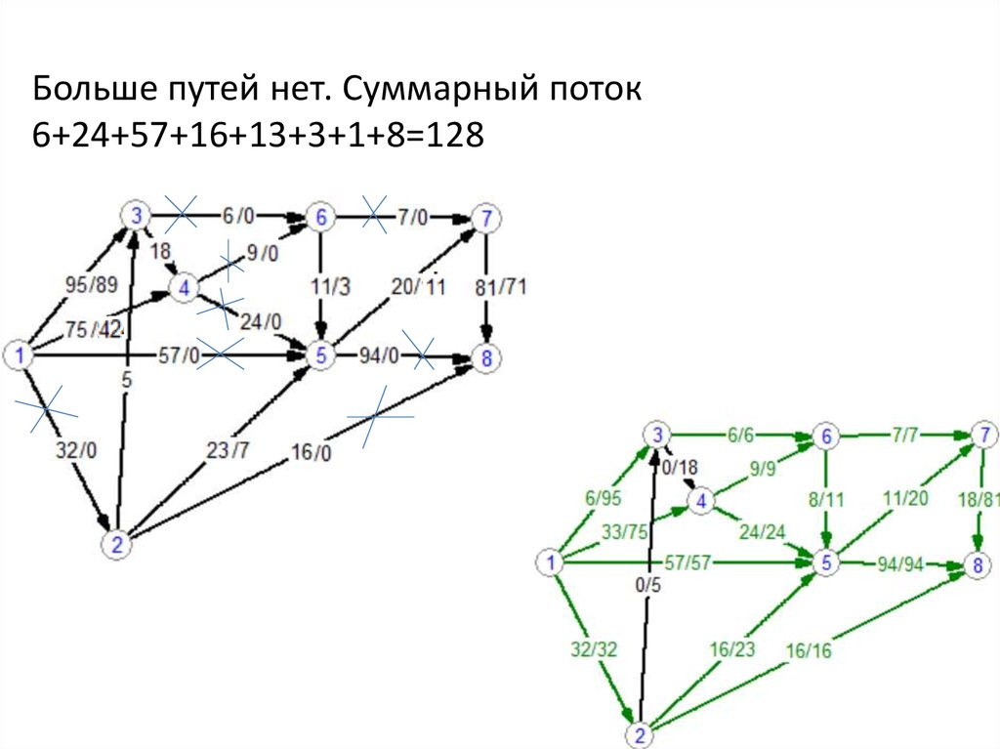

Еще один пример

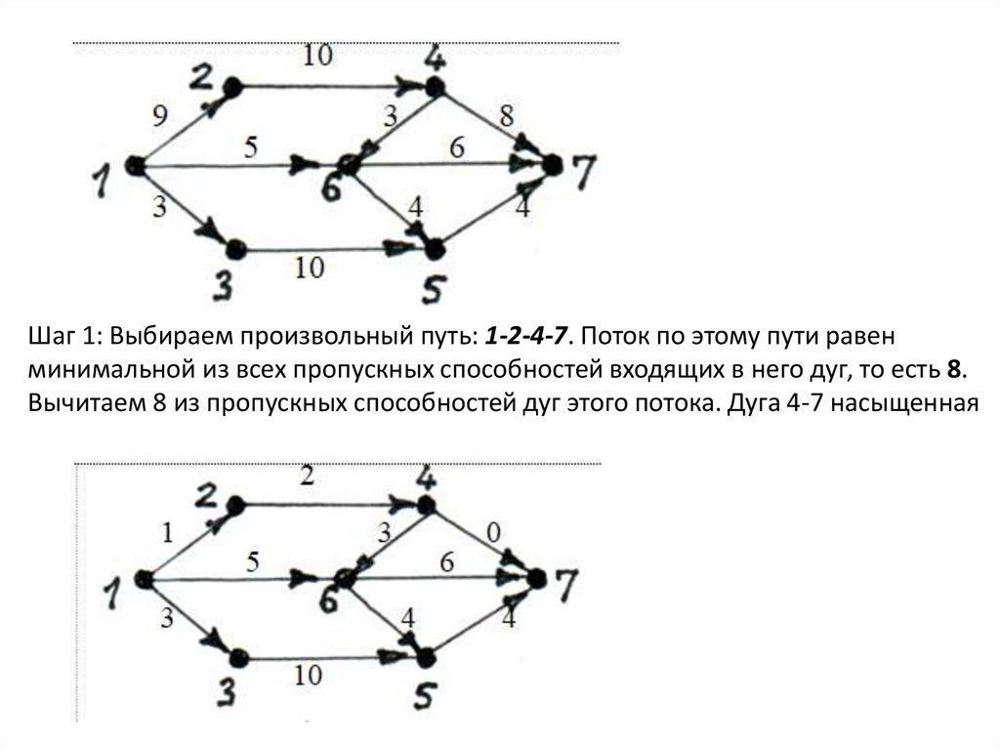

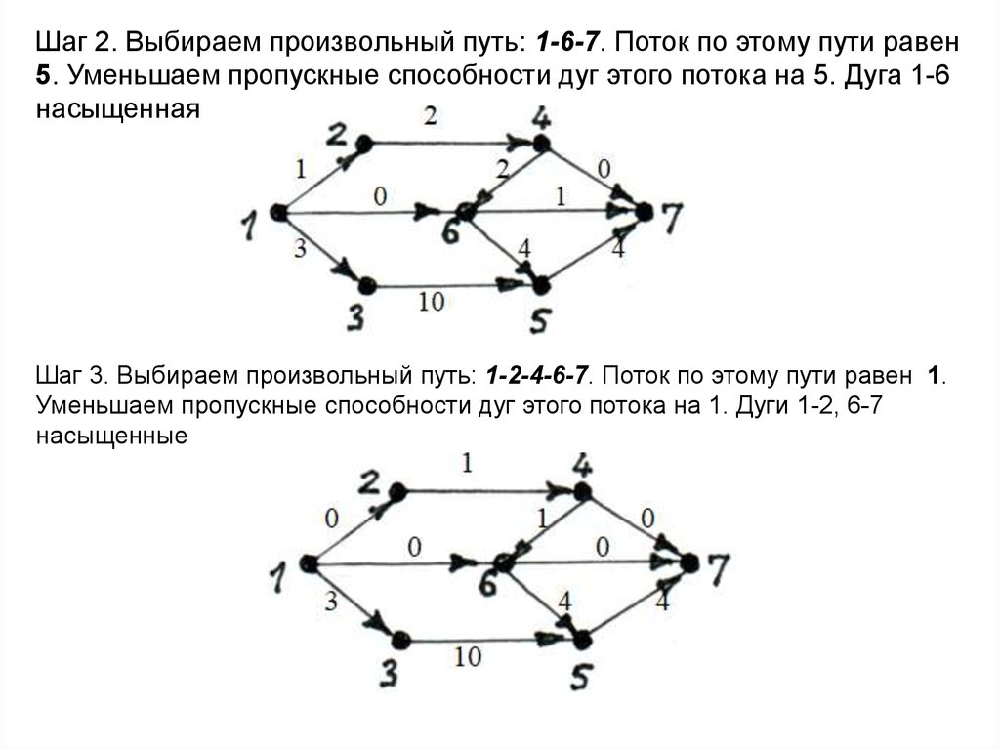

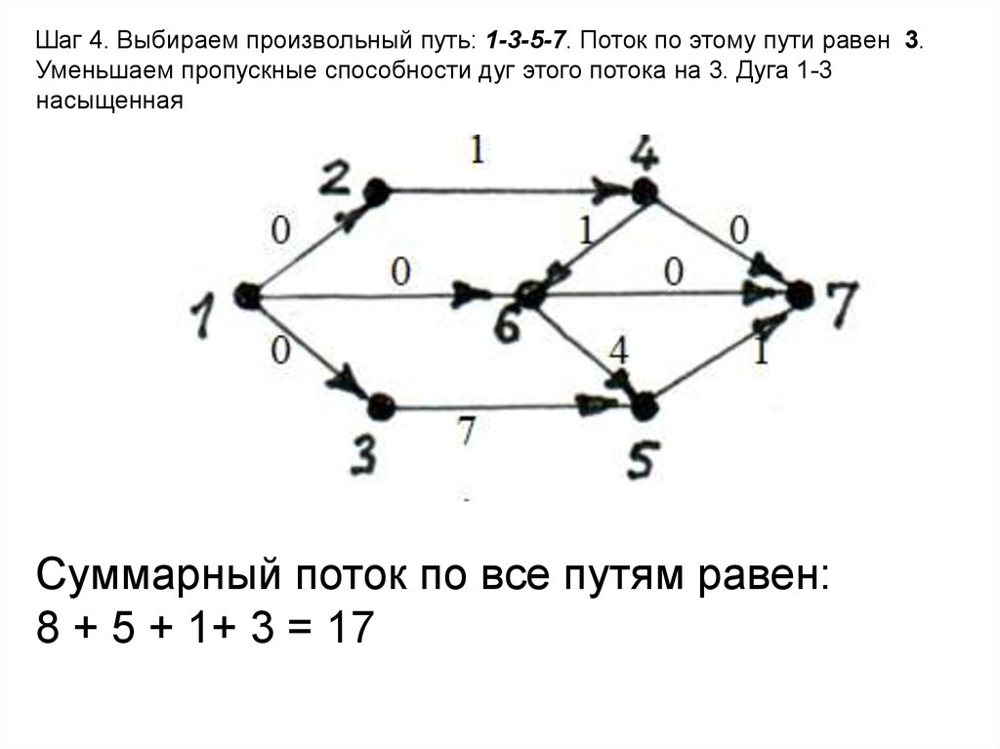

Теперь реализуем код

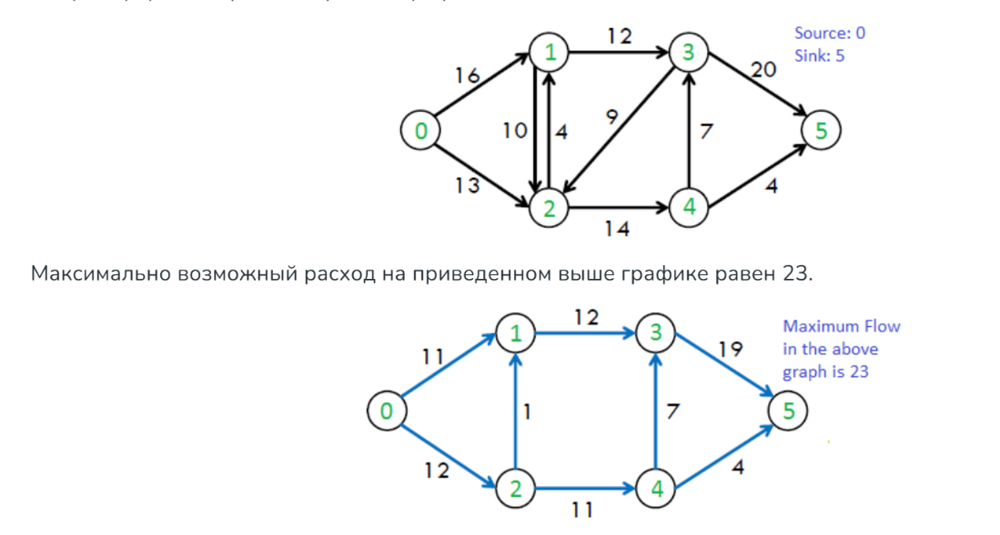

BFS используется для поиска пути от истока к стоку в остаточном графе.

FordFulkerson:

Находит путь с помощью BFS.

Определяет минимальную пропускную способность на этом пути.

Увеличивает общий поток на эту величину.

Обновляет остаточные пропускные способности рёбер.

In [22]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    '''Метод BFS (поиск в ширину) для поиска пути от истока 's' до стока 't'.
       Также заполняет массив parent[], чтобы сохранить путь.'''
    def BFS(self, s, t, parent):
        # Массив для отметки посещённых вершин
        visited = [False] * (self.ROW)
        # Очередь для BFS
        queue = []
        # Отмечаем исходную вершину как посещённую и добавляем её в очередь
        queue.append(s)
        visited[s] = True
        # Основной цикл BFS
        while queue:
            # Извлекаем вершину из очереди
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False
    # Сам метод для нахождения максимального потока с использованием алгоритма Форда-Фалкерсона
    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  # Изначально поток равен 0
        # Пока существует путь от истока к стоку
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            # Добавляем поток пути к общему потоку
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  # Уменьшаем пропускную способность прямого ребра
                self.graph[v][u] += path_flow  # Увеличиваем пропускную способность обратного ребра
                v = parent[v]
        return max_flow


graph = [
    [0, 16, 13, 0, 0, 0],  # Вершина 0 (исток)
    [0, 0, 10, 12, 0, 0],   # Вершина 1
    [0, 4, 0, 0, 14, 0],    # Вершина 2
    [0, 0, 9, 0, 0, 20],    # Вершина 3
    [0, 0, 0, 7, 0, 4],     # Вершина 4
    [0, 0, 0, 0, 0, 0]      # Вершина 5 (сток)
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 5

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 23


Как работают обратные рёбра?
В остаточном графе каждое прямое ребро имеет пропускную способность, равную исходной пропускной способности.
Обратные рёбра изначально имеют пропускную способность 0

После отправки потока:

Если по ребру (u,v) прошёл поток величиной f, то:
Пропускная способность прямого ребра (u,v) уменьшается на f

Пропускная способность обратного ребра (v,u) увеличивается на f


Пусть есть ребро (u,v) с пропускной способностью 10

Если по нему прошёл поток 4, то (u,v) теперь имеет пропускную способность 10−4=6

Обратное ребро (v,u) теперь имеет пропускную способность 0+4=4

Обратные рёбра позволяют алгоритму "отменять" часть уже отправленного потока и перенаправлять его по другим путям. Это важно, потому что изначально выбранный путь может не быть оптимальным, и обратные рёбра дают возможность исправить это.

### Пример когда обратные ребра не нужны

In [83]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    '''Метод BFS (поиск в ширину) для поиска пути от истока 's' до стока 't'.
       Также заполняет массив parent[], чтобы сохранить путь.'''
    def BFS(self, s, t, parent):
        # Массив для отметки посещённых вершин
        visited = [False] * (self.ROW)
        # Очередь для BFS
        queue = []
        # Отмечаем исходную вершину как посещённую и добавляем её в очередь
        queue.append(s)
        visited[s] = True
        # Основной цикл BFS
        while queue:
            # Извлекаем вершину из очереди
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False
    # Сам метод для нахождения максимального потока с использованием алгоритма Форда-Фалкерсона
    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  # Изначально поток равен 0
        # Пока существует путь от истока к стоку
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            # Добавляем поток пути к общему потоку
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  # Уменьшаем пропускную способность прямого ребра
                v = parent[v]
        return max_flow


graph = [
    [0, 3, 2, 0],  # 0 -> 1, 0 -> 2
    [0, 0, 2, 2],  # 1 -> 2, 1 -> 3
    [0, 0, 0, 3],  # 2 -> 3
    [0, 0, 0, 0]   # Сток (3)
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 3

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 5


## Пример когда они нужны

In [ ]:
graph = [
    [0, 1, 1, 0, 0],  # s (0) -> a (1), s (0) -> b (2)
    [0, 0, 0, 1, 0],  # a (1) -> c (3)
    [0, 0, 0, 1, 1],  # b (2) -> c (3), b (2) -> d (4)
    [0, 0, 0, 0, 1],  # c (3) -> t (5)
    [0, 0, 0, 0, 0]   # d (4) -> t (5)
]

In [1]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    '''Метод BFS (поиск в ширину) для поиска пути от истока 's' до стока 't'.
       Также заполняет массив parent[], чтобы сохранить путь.'''
    def BFS(self, s, t, parent):
        # Массив для отметки посещённых вершин
        visited = [False] * (self.ROW)
        # Очередь для BFS
        queue = []
        # Отмечаем исходную вершину как посещённую и добавляем её в очередь
        queue.append(s)
        visited[s] = True
        # Основной цикл BFS
        while queue:
            # Извлекаем вершину из очереди
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False

    # Сам метод для нахождения максимального потока с использованием алгоритма Форда-Фалкерсона
    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  # Изначально поток равен 0
        # Пока существует путь от истока к стоку
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            # Добавляем поток пути к общему потоку
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  # Уменьшаем пропускную способность прямого ребра
                v = parent[v]
        return max_flow
graph = [
    [0, 1, 1, 0, 0],  # s (0) -> a (1), s (0) -> b (2)
    [0, 0, 0, 1, 0],  # a (1) -> c (3)
    [0, 0, 0, 1, 1],  # b (2) -> c (3), b (2) -> d (4)
    [0, 0, 0, 0, 1],  # c (3) -> t (5)
    [0, 0, 0, 0, 0]   # d (4) -> t (5)
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 4

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 2


Почему тут корректно отработало и без обратных ребер?

## Еще один пример, посидите посмотрите на него

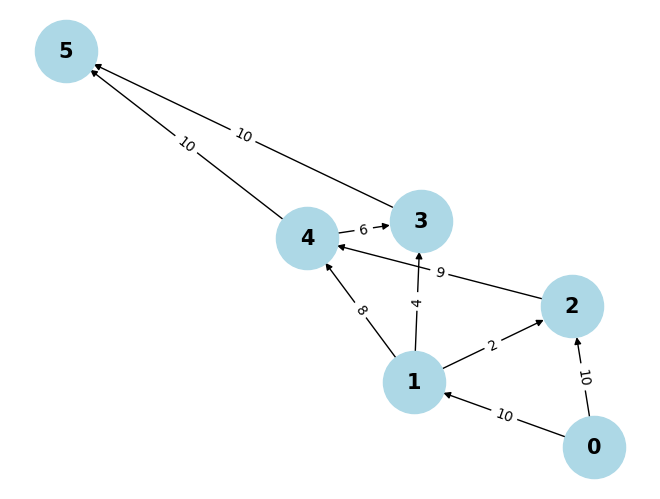

In [72]:
import networkx as nx
import matplotlib.pyplot as plt

graph = [
    [0, 10, 10, 0, 0, 0],  # Вершина 0 (исток)
    [0, 0, 2, 4, 8, 0],    # Вершина 1
    [0, 0, 0, 0, 9, 0],    # Вершина 2
    [0, 0, 0, 0, 0, 10],   # Вершина 3
    [0, 0, 0, 6, 0, 10],   # Вершина 4
    [0, 0, 0, 0, 0, 0]     # Вершина 5 (сток)
]

G = nx.DiGraph()
for i in range(len(graph)):
    for j in range(len(graph[i])):
        if graph[i][j] != 0:
            G.add_edge(i, j, weight=graph[i][j])

pos = nx.spring_layout(G)

nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=15, font_weight='bold')

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

plt.show()

In [75]:
from collections import defaultdict

class Graph:
    def __init__(self, graph):
        self.graph = graph
        self.ROW = len(graph)

    def BFS(self, s, t, parent):
        visited = [False] * self.ROW
        queue = [s]
        visited[s] = True

        while queue:
            u = queue.pop(0)
            for ind, val in enumerate(self.graph[u]):
                if not visited[ind] and val > 0:
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u
                    if ind == t:
                        return True
        return False

    def FordFulkerson(self, source, sink):
        parent = [-1] * self.ROW
        max_flow = 0

        while self.BFS(source, sink, parent):
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            
            max_flow += path_flow
            v = sink
            print("Путь найден с потоком:", path_flow)
            while v != source:
                u = parent[v]
                print(u, v)
                print(f"Уменьшаем прямое ребро {u} -> {v} на {path_flow}. Остаточная пропускная способность: {self.graph[u][v] - path_flow}")
                self.graph[u][v] -= path_flow
                print(f"Увеличиваем обратное ребро {v} -> {u} на {path_flow}. Новая пропускная способность обратного ребра: {self.graph[v][u] + path_flow}")
                self.graph[v][u] += path_flow
                v = parent[v]
                print (v)
            print("Текущий остаточный граф:")
            for row in self.graph:
                print(row)
            print("---")
        
        return max_flow

graph = [
    [0, 10, 10, 0, 0, 0],  # Вершина 0 (исток)
    [0, 0, 2, 4, 8, 0],    # Вершина 1
    [0, 0, 0, 0, 9, 0],    # Вершина 2
    [0, 0, 0, 0, 0, 10],   # Вершина 3
    [0, 0, 0, 6, 0, 10],   # Вершина 4
    [0, 0, 0, 0, 0, 0]     # Вершина 5 (сток)
]

g = Graph(graph)
source, sink = 0, 5
print("Максимальный возможный поток равен", g.FordFulkerson(source, sink))

Путь найден с потоком: 4
3 5
Уменьшаем прямое ребро 3 -> 5 на 4. Остаточная пропускная способность: 6
3
1 3
Уменьшаем прямое ребро 1 -> 3 на 4. Остаточная пропускная способность: 0
1
0 1
Уменьшаем прямое ребро 0 -> 1 на 4. Остаточная пропускная способность: 6
0
Текущий остаточный граф:
[0, 6, 10, 0, 0, 0]
[0, 0, 2, 0, 8, 0]
[0, 0, 0, 0, 9, 0]
[0, 0, 0, 0, 0, 6]
[0, 0, 0, 6, 0, 10]
[0, 0, 0, 0, 0, 0]
---
Путь найден с потоком: 6
4 5
Уменьшаем прямое ребро 4 -> 5 на 6. Остаточная пропускная способность: 4
4
1 4
Уменьшаем прямое ребро 1 -> 4 на 6. Остаточная пропускная способность: 2
1
0 1
Уменьшаем прямое ребро 0 -> 1 на 6. Остаточная пропускная способность: 0
0
Текущий остаточный граф:
[0, 0, 10, 0, 0, 0]
[0, 0, 2, 0, 2, 0]
[0, 0, 0, 0, 9, 0]
[0, 0, 0, 0, 0, 6]
[0, 0, 0, 6, 0, 4]
[0, 0, 0, 0, 0, 0]
---
Путь найден с потоком: 4
4 5
Уменьшаем прямое ребро 4 -> 5 на 4. Остаточная пропускная способность: 0
4
2 4
Уменьшаем прямое ребро 2 -> 4 на 4. Остаточная пропускная способность: 5
2
0 2


# Алгоритм Диница

Дан граф, представляющий собой сеть потоков, в которой каждое ребро имеет пропускную способность. Также заданы две вершины — источник «s» и сток «t» — в графе. Найдите максимально возможный поток из s в t при следующих ограничениях:

Поток по кромке не превышает заданную пропускную способность.
Входящий поток равен исходящему для каждой вершины, кроме s и t.

То есть Вы получаете:

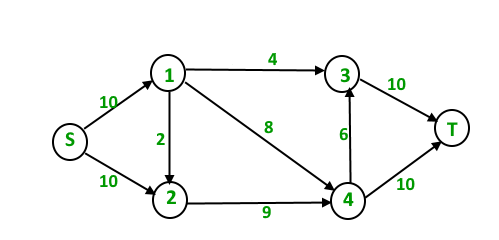

И отдаете 19, так как:

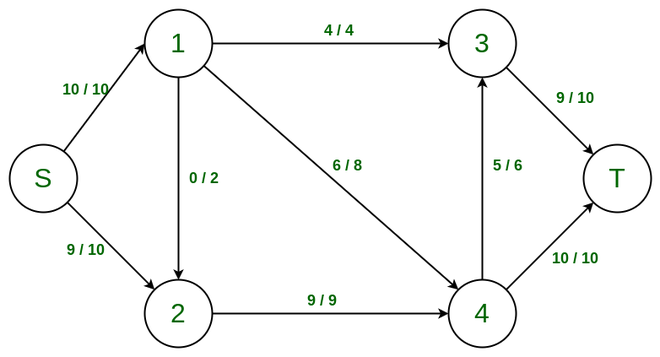

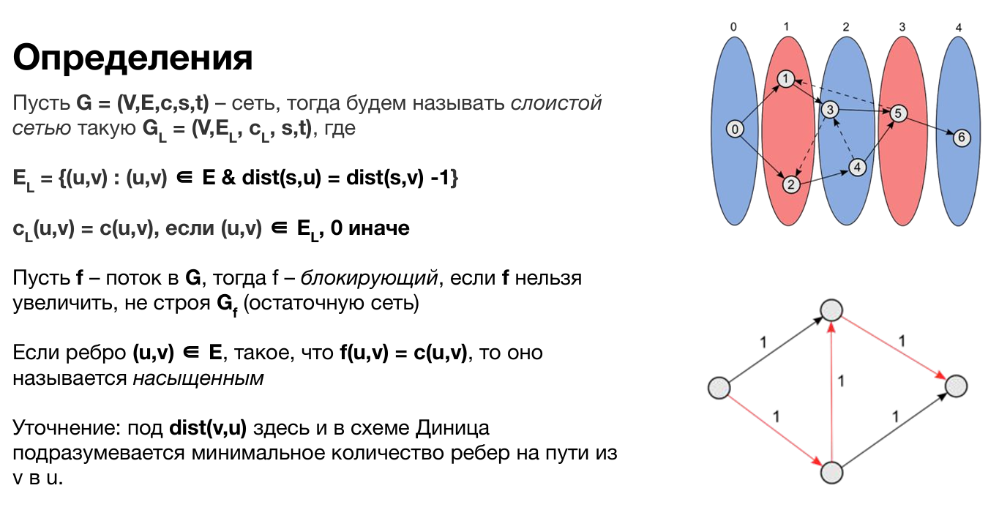

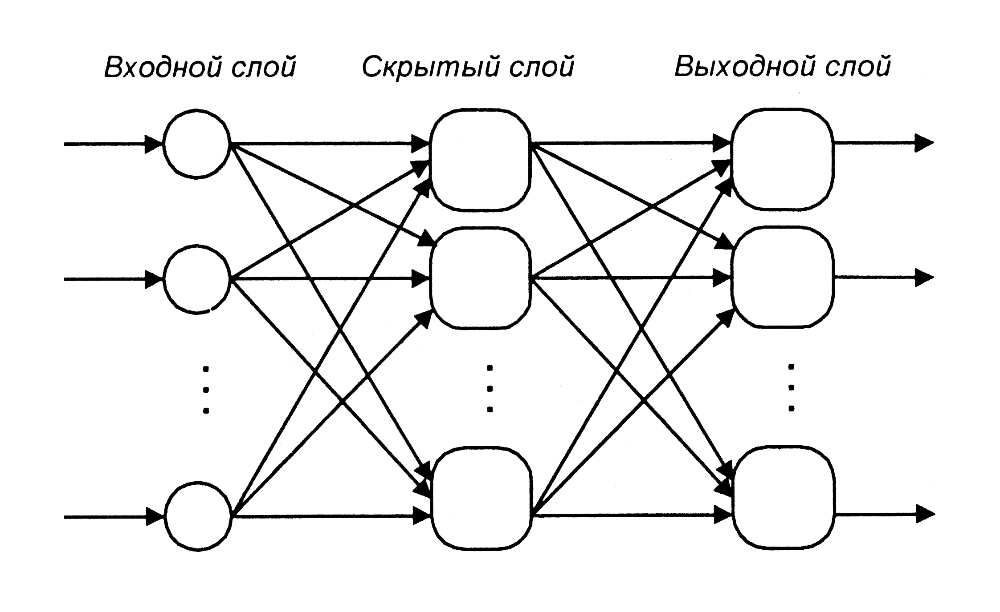

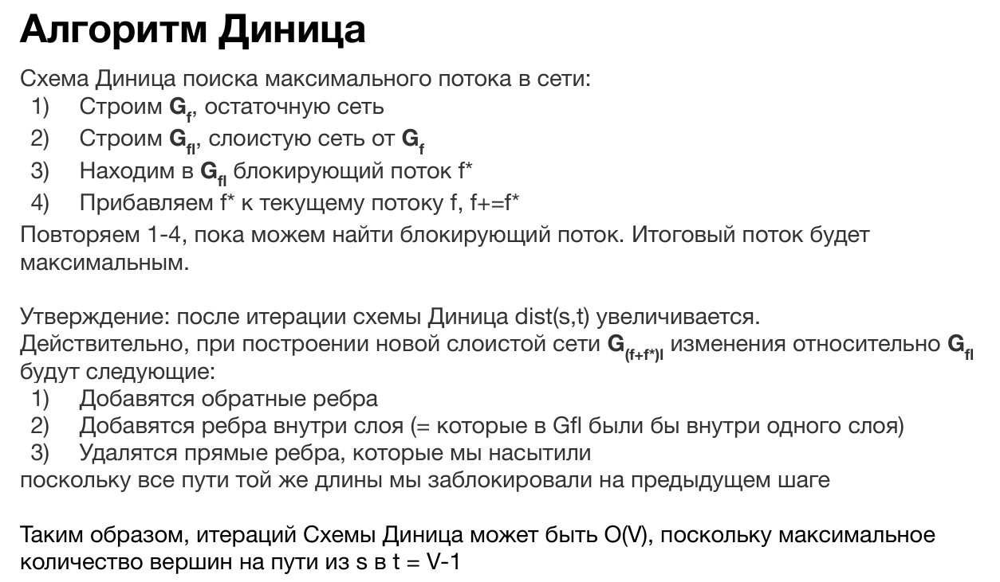

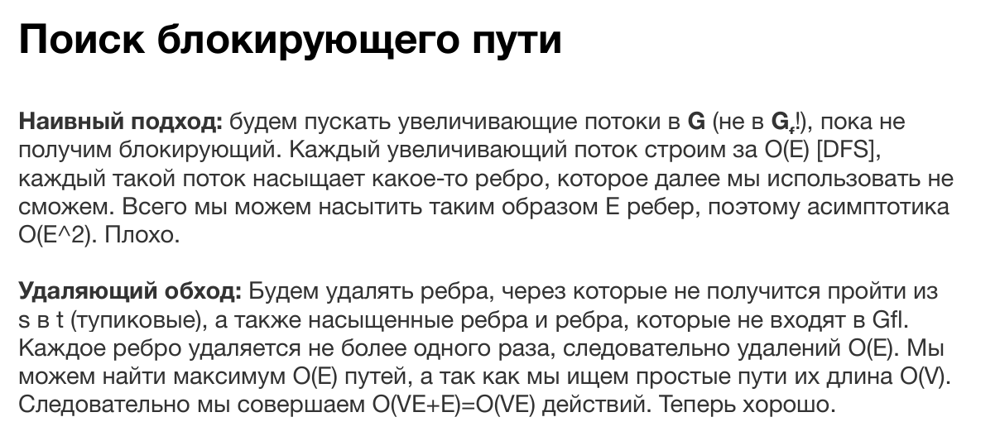

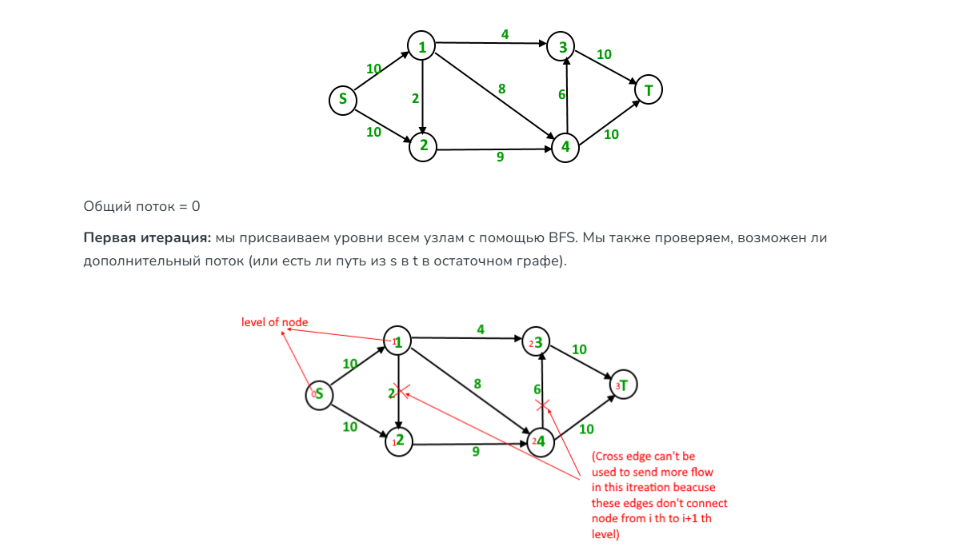

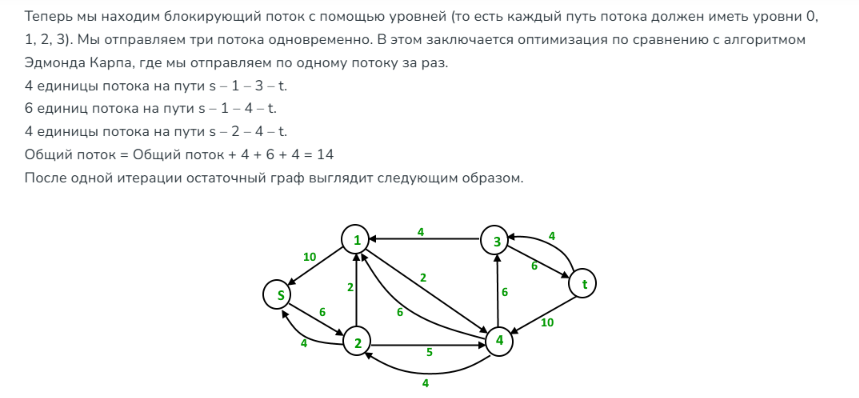

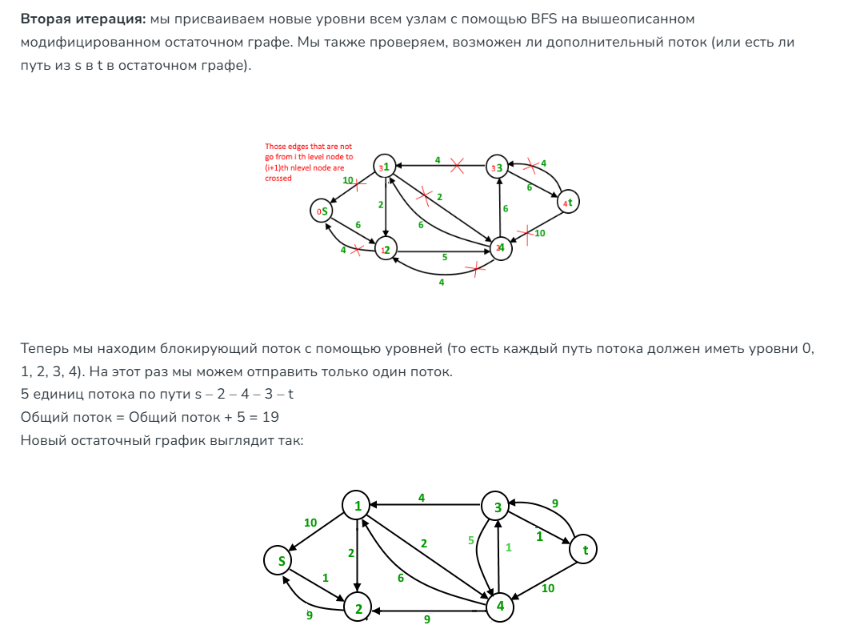

Третья итерация: мы запускаем BFS и создаём граф уровней. Мы также проверяем, возможен ли дополнительный поток, и продолжаем только в том случае, если это возможно. На этот раз в остаточном графе нет пути s-t, поэтому мы завершаем алгоритм.

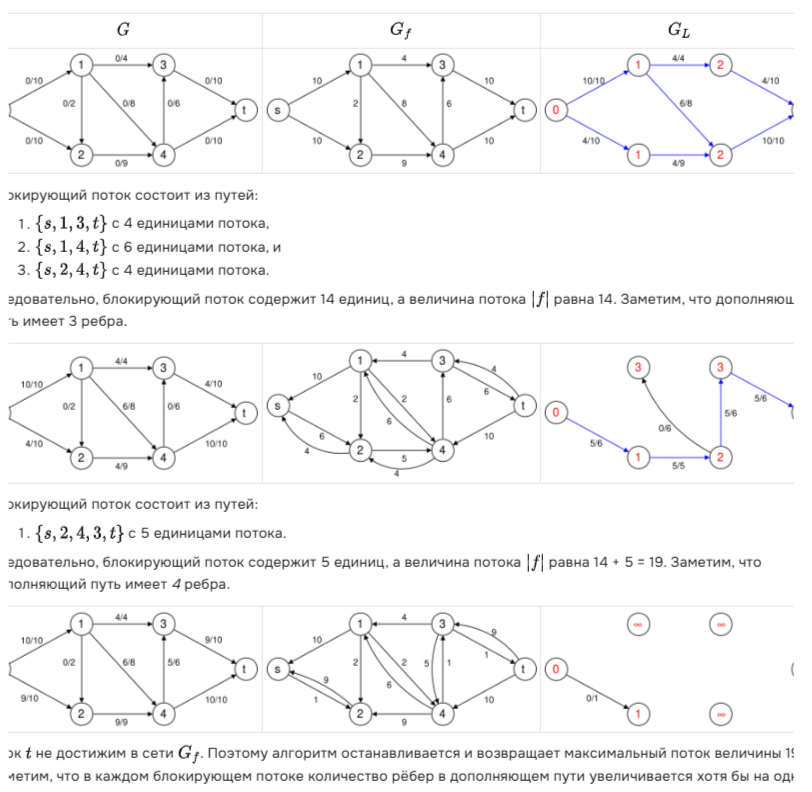

In [36]:
class Edge:
    def __init__(self, v, flow, C, rev):
        self.v = v  # Вершина, в которую ведет ребро
        self.flow = flow  # Текущий поток через ребро
        self.C = C  # Пропускная способность ребра
        self.rev = rev  # Индекс обратного ребра в списке смежности целевой вершины

# Класс для представления остаточной сети
class Graph:
    def __init__(self, V):
        self.adj = [[] for i in range(V)]  # Список смежности для хранения рёбер
        self.V = V  # Количество вершин в графе
        self.level = [0 for i in range(V)]  # Уровни вершин для BFS

    # Добавление ребра в граф
    def addEdge(self, u, v, C):
        # Прямое ребро: поток 0, пропускная способность C
        a = Edge(v, 0, C, len(self.adj[v]))
        # Обратное ребро: поток 0, пропускная способность 0
        b = Edge(u, 0, 0, len(self.adj[u]))
        self.adj[u].append(a)  # Добавляем прямое ребро в список смежности вершины u
        self.adj[v].append(b)  # Добавляем обратное ребро в список смежности вершины v

    # Поиск в ширину (BFS) для определения уровней вершин
    # и проверки возможности отправки потока от s к t
    def BFS(self, s, t):
        for i in range(self.V):
            self.level[i] = -1  # Инициализируем уровни всех вершин как -1

        self.level[s] = 0  # Уровень исходной вершины равен 0

        # Создаем очередь и добавляем в нее исходную вершину
        q = []
        q.append(s)
        while q:
            u = q.pop(0)  # Извлекаем вершину из очереди
            for i in range(len(self.adj[u])):
                e = self.adj[u][i]
                # Если вершина e.v не посещена и поток через ребро меньше пропускной способности
                if self.level[e.v] < 0 and e.flow < e.C:
                    self.level[e.v] = self.level[u] + 1  # Устанавливаем уровень вершины e.v
                    q.append(e.v)  # Добавляем вершину e.v в очередь

        # Если достигли стока, возвращаем True, иначе False
        return False if self.level[t] < 0 else True

    # Поиск в глубину (DFS) для отправки потока после того, как BFS определил уровни
    # flow: текущий поток, который можно отправить
    # start[]: массив для отслеживания следующего ребра для исследования
    # u: текущая вершина
    # t: сток
    def sendFlow(self, u, flow, t, start):
        if u == t:  # Если достигли стока, возвращаем поток
            return flow

        # Перебираем все ребра из текущей вершины
        while start[u] < len(self.adj[u]):
            e = self.adj[u][start[u]]  # Берем следующее ребро
            # Если уровень следующей вершины на 1 больше текущего и поток через ребро меньше пропускной способности
            if self.level[e.v] == self.level[u] + 1 and e.flow < e.C:
                # Находим минимальный поток от u до t
                curr_flow = min(flow, e.C - e.flow)
                temp_flow = self.sendFlow(e.v, curr_flow, t, start)  # Рекурсивно отправляем поток

                # Если поток больше нуля
                if temp_flow and temp_flow > 0:
                    e.flow += temp_flow  # Увеличиваем поток через текущее ребро
                    self.adj[e.v][e.rev].flow -= temp_flow  # Уменьшаем поток через обратное ребро
                    return temp_flow
            start[u] += 1  # Переходим к следующему ребру

    # Функция для нахождения максимального потока в графе
    def DinicMaxflow(self, s, t):
        if s == t:  # Если источник и сток совпадают, возвращаем -1
            return -1

        total = 0  # Инициализируем общий поток

        # Пока существует путь от источника к стоку
        while self.BFS(s, t) == True:
            start = [0 for i in range(self.V + 1)]  # Инициализируем массив start
            while True:
                flow = self.sendFlow(s, float('inf'), t, start)  # Отправляем поток
                if not flow:  # Если поток равен 0, выходим из цикла
                    break
                total += flow  # Добавляем поток к общему потоку

        return total  

g = Graph(6)
g.addEdge(0, 1, 16)
g.addEdge(0, 2, 13)
g.addEdge(1, 2, 10)
g.addEdge(1, 3, 12)
g.addEdge(2, 1, 4)
g.addEdge(2, 4, 14)
g.addEdge(3, 2, 9)
g.addEdge(3, 5, 20)
g.addEdge(4, 3, 7)
g.addEdge(4, 5, 4)
print("Максимальный поток", g.DinicMaxflow(0, 5))

Максимальный поток 23
